Download Data

In [3]:
import utils

utils.download_data()
compositions, uc_params, imgdata = utils.parse_files()
SBFO_data = utils.process_data(compositions, uc_params, imgdata)

Downloading: data/Sm_0_1_HAADF.h5


153283KB [00:07, 19488.19KB/s]                                 


Downloading: data/Sm_0_1_UCParameterization.h5


 54%|█████▍    | 4311/7916.828125 [00:01<00:00, 8040.54KB/s]/home/alexk101/.mambaforge/envs/micrography/lib/python3.11/site-packages/tqdm/std.py:636: TqdmWarning: clamping frac to range [0, 1]
  full_bar = Bar(frac,
100%|██████████| 7917/7916.828125 [00:01<00:00, 6689.94KB/s]


Downloading: data/Sm_7_2_HAADF.h5


141547KB [00:07, 17846.02KB/s]                                   


Downloading: data/Sm_7_2_UCParameterization.h5


8382KB [00:01, 6877.31KB/s]                                 


Downloading: data/Sm_10_1_HAADF.h5


100%|██████████| 159862/159861.890625 [00:08<00:00, 19980.63KB/s]


Downloading: data/Sm_10_1_UCParameterization.h5


100%|██████████| 7718/7717.953125 [00:01<00:00, 5932.57KB/s] 


Downloading: data/Sm_13_0_HAADF.h5


100%|██████████| 151863/151862.5546875 [00:08<00:00, 18606.51KB/s]


Downloading: data/Sm_13_0_UCParameterization.h5


7040KB [00:01, 4015.19KB/s]                                 


Downloading: data/Sm_20_0_HAADF.h5


100%|██████████| 149363/149362.796875 [00:07<00:00, 18833.68KB/s]


Downloading: data/Sm_20_0_UCParameterization.h5


7267KB [00:15, 469.18KB/s]                               


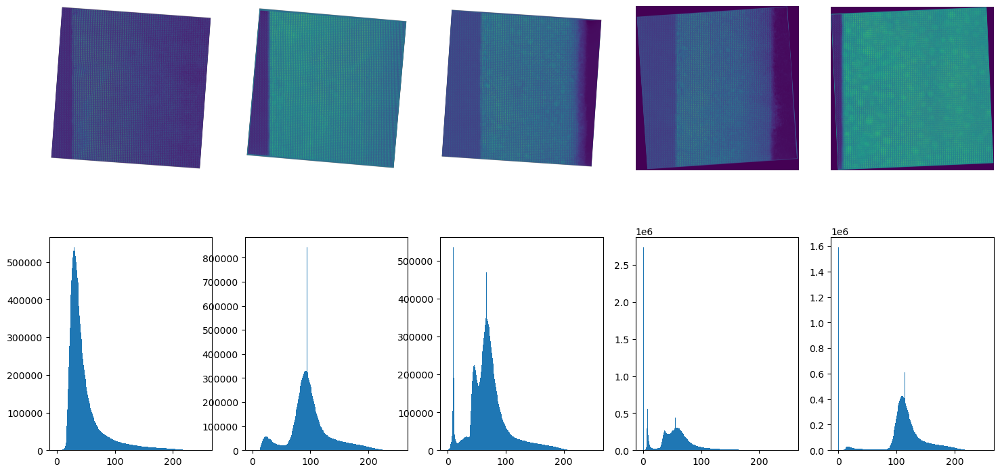

In [4]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
# import mlx.core as np

target = Path('sample_imgs')
target.mkdir(exist_ok=True)

fig, axes = plt.subplots(2,len(SBFO_data), figsize=(18,9))
for i, (im, ax, ax2) in enumerate(zip(SBFO_data, axes[0], axes[1])):
    ax.imshow(im['image'])
    ax.set_axis_off()
    
    # Image histogram
    ax2.hist(im['image'][:].ravel(), bins=256, range=(0, 255), fc='k', ec='k')

    if not (target / f"sample_{i}.png").exists():
        img = Image.fromarray(im['image'][:])
        img = img.convert("L")  # Convert to grayscale
        img.save(target / f"sample_{i}.png")

Number of regions with size >= 200: 60
Number of regions with size >= 200: 159
Number of regions with size >= 200: 180
Number of regions with size >= 200: 197
Number of regions with size >= 200: 20


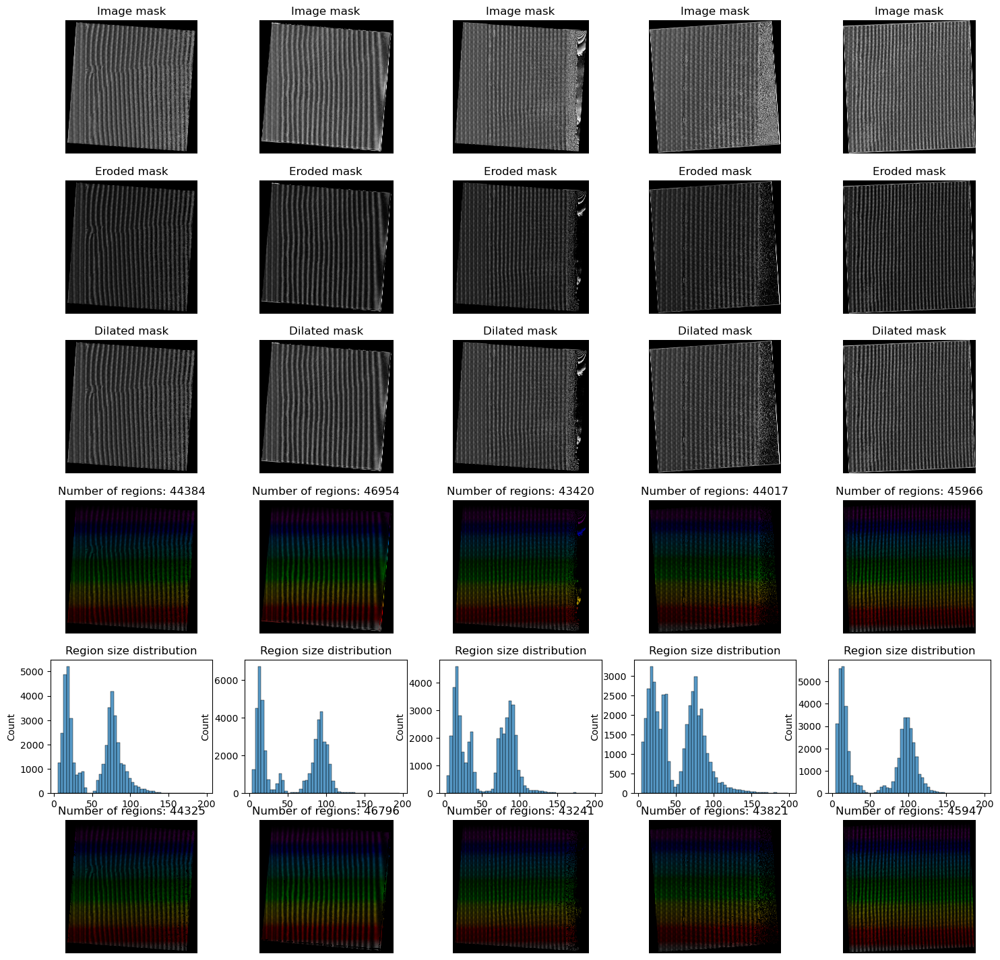

In [5]:
from skimage.morphology import binary_erosion, binary_dilation, disk
import numpy as np
from skimage.filters import threshold_local
from skimage.feature import peak_local_max
from skimage import img_as_ubyte
import seaborn as sns
from scipy import ndimage as ndi
import matplotlib as mpl
from sklearn.cluster import DBSCAN

images = {}

x = []
y = []

fig, axes = plt.subplots(6,len(SBFO_data), figsize=(18,18))
for i, (im, (ax, ax2, ax3, ax4, ax5, ax6)) in enumerate(zip(SBFO_data, axes.T)):
    data = {}
    thresh = threshold_local(im['image'][:], block_size=31, method='gaussian', offset=0)
    binary = im['image'] > thresh
    data['binary'] = binary
    
    x.append(im['image'][:])

    # Plotting
    ax.imshow(binary, cmap='gray')
    ax.set_axis_off()
    ax.set_title("Image mask")

    img = Image.fromarray(img_as_ubyte(binary))
    img.save(target / f"sample_{i}_binary.png")

    eroded = binary_erosion(binary, disk(2))
    data['eroded'] = eroded

    # Plotting
    ax2.imshow(eroded, cmap='gray')
    ax2.set_axis_off()
    ax2.set_title("Eroded mask")

    img = Image.fromarray(img_as_ubyte(eroded))
    img.save(target / f"sample_{i}_eroded.png")
    
    dilated = binary_dilation(eroded, disk(1))
    data['dilated'] = dilated

    img = Image.fromarray(img_as_ubyte(dilated))
    img.save(target / f"sample_{i}_dilated.png")

    # Plotting
    ax3.imshow(dilated, cmap='gray')
    ax3.set_axis_off()
    ax3.set_title("Dilated mask")

    #Preform DBSCAN segmentationdistance = ndi.distance_transform_edt(dilated)
    distance = ndi.distance_transform_edt(dilated)
    coords = np.column_stack(np.nonzero(eroded))  # Extract coordinates of non-zero pixels
    dbscan = DBSCAN(eps=3, min_samples=5)  # Adjust `eps` and `min_samples` as needed
    label_db = dbscan.fit_predict(coords)  # Cluster the coordinates
    
    # Map DBSCAN labels back to the 2D image
    labels = np.zeros_like(eroded, dtype=int)  # Initialize the 2D label image
    for coord, label in zip(coords, label_db):
        if label != -1:  # Exclude noise points
            labels[tuple(coord)] = label + 1  # Avoid 0 for background
    
    data['clf'] = labels
    
    y.append(labels)

    # Plotting
    ax4.imshow(labels, cmap='nipy_spectral')
    ax4.set_axis_off()
    ax4.set_title(f"Number of regions: {len(np.unique(labels))}")

    cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(labels))))
    colored_labels = np.array([cm[label] for label in labels])
    
    colored_labels = (colored_labels * 255).astype(np.uint8)  # Convert to uint8
    
    img = Image.fromarray(colored_labels)
    img.save(target / f"sample_{i}_clf.png")

    # Count number of elements in each class
    cutoff = 200
    sizes = np.bincount(labels.ravel())
    class_sizes = dict(zip(np.unique(labels), sizes))
    # Remove anything bigger than set number of pixels
    class_sizes = {k: v for k, v in class_sizes.items() if v < cutoff}
    num_greater = len(sizes[sizes >= cutoff])
    sizes = np.array(list(class_sizes.values()))
    print(f"Number of regions with size >= {cutoff}: {num_greater}")

    # Plotting
    sns.histplot(sizes, bins=50, ax=ax5)
    ax5.set_title("Region size distribution")

    pruned_labels = labels.copy()
    pruned_labels[~np.isin(labels, list(class_sizes.keys()))] = 0
    data['pruned'] = pruned_labels

    # Plotting
    ax6.imshow(pruned_labels, cmap='nipy_spectral')
    ax6.set_axis_off()
    ax6.set_title(f"Number of regions: {len(np.unique(pruned_labels))}")

    colored_pruned_labels = np.array([cm[label] for label in pruned_labels])
    colored_pruned_labels = (colored_pruned_labels * 255).astype(np.uint8)
    
    img = Image.fromarray(colored_pruned_labels)
    img.save(target / f"sample_{i}_clf_pruned.png")
    
    images[i] = data

In [6]:
x = [np.nan_to_num(arr, nan=0) for arr in x]

In [7]:
print("Image Shapes:")
for i in range(len(x)):
    print("idx", i, len(x[i]), len(x[i][0]))

Image Shapes:
idx 0 4454 4405
idx 1 4520 4527
idx 2 4375 4443
idx 3 4397 4348
idx 4 4268 4245


In [8]:
print("Label Shapes:")
for i in range(len(y)):
    print("idx", i, len(y[i]), len(y[i][0]))

Label Shapes:
idx 0 4454 4405
idx 1 4520 4527
idx 2 4375 4443
idx 3 4397 4348
idx 4 4268 4245


In [9]:
import polars as pl
import numba
# Use dispersion of the region sizes to determine outliers

# Numba Optimized
def numba_class_stats(data):
    @numba.njit(fastmath=True, parallel=True)
    def get_stats(data):
        all_outputs = np.zeros((len(np.unique(data)) - 1, 6))
        classes = np.unique(data)[1:]
        for ind in numba.prange(classes.size):
            c = classes[ind]
            x, y = np.where(c == data)
            all_outputs[ind] = [c, x.size, np.median(x), np.median(y), np.std(x), np.std(y)]
        return all_outputs

    output_np = get_stats(data)
    cols_dtypes = {
        'class': pl.UInt32, 
        'size': pl.UInt32, 
        'median_x': pl.UInt32, 
        'median_y': pl.UInt32, 
        'std_x': pl.Float32, 
        'std_y': pl.Float32
    }
    output = pl.DataFrame(output_np, schema=cols_dtypes)    
    return output

In [10]:
def extract_windows(x, y, window_size, stride):
    # Initialize lists to hold the windows
    windows_x = []
    windows_y = []
    
    # Loop over each image in x and corresponding label in y
    for img, label in zip(x, y):
        height, width = img.shape
        
        # Calculate the number of windows in height and width
        num_windows_x = (height - window_size) // stride + 1
        num_windows_y = (width - window_size) // stride + 1
        
        # Slide over the image and label to extract windows
        for i in range(num_windows_x):
            for j in range(num_windows_y):
                start_i = i * stride
                start_j = j * stride
                
                window_x = img[start_i:start_i+window_size, start_j:start_j+window_size]  # Extract window from image
                window_y = label[start_i:start_i+window_size, start_j:start_j+window_size]  # Extract window from label
                
                # Append to the list of windows
                windows_x.append(window_x)
                windows_y.append(window_y)
    
    # Convert lists to numpy arrays
    windows_x = np.array(windows_x)
    windows_y = np.array(windows_y)
    
    return windows_x, windows_y

#Needs a lot of memory, adjust stride/window size to conserve

stride = 16
window_size = 32  # N
windows_x, windows_y = extract_windows(x, y, window_size, stride)

print("Dataset Size:", len(windows_x))

Dataset Size: 373601


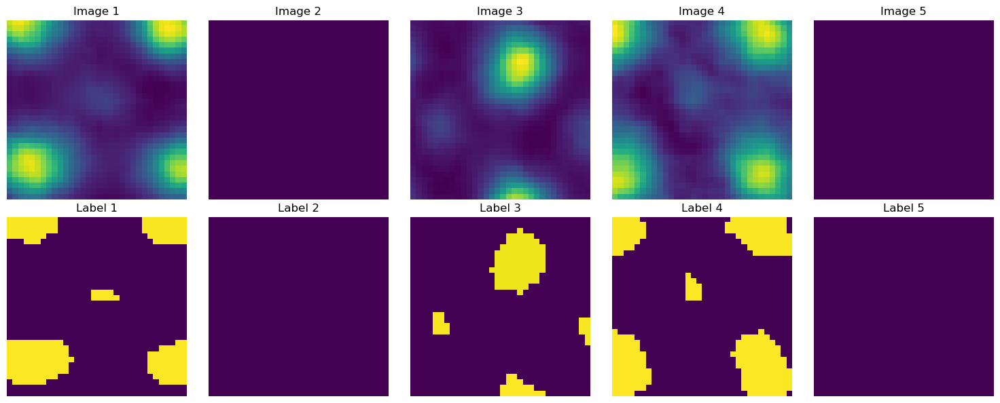

In [11]:
num_samples = 5
random_indices = np.random.choice(len(windows_x), num_samples, replace=False)

fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
for i, idx in enumerate(random_indices):
    # Image window
    axes[0, i].imshow(windows_x[idx], cmap='viridis')
    axes[0, i].set_title(f"Image {i+1}")
    axes[0, i].axis('off')
    
    # Label window
    axes[1, i].imshow(windows_y[idx])
    axes[1, i].set_title(f"Label {i+1}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

In [12]:
class_data = numba_class_stats(images[0]['pruned'])

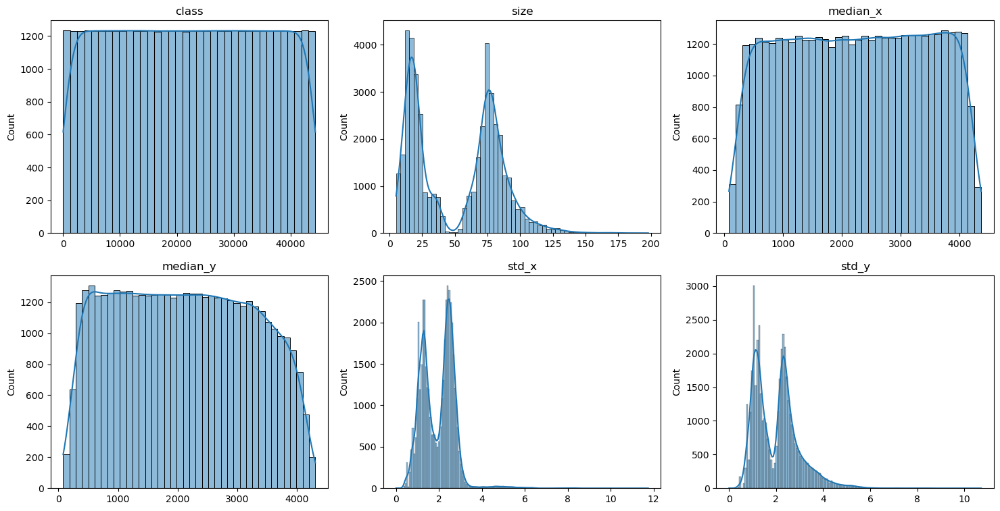

In [13]:
fig, axes = plt.subplots(2, len(class_data.columns)//2, figsize=(18, 9))
for i, (col, ax) in enumerate(zip(class_data.columns, axes.flatten())):
    sns.histplot(class_data[col], ax=ax, kde=True)
    ax.set_title(col)

In [14]:
# Calculate nearest neighbor distances of 4 nearest neighbors
# The data consists of a 2d array where the non-zero values are the regions
# The distance should be the euclidean distance between the centroids of the regions
# The output should be a 2d array of shape (n, 4) where n is the number of regions
# The output should be the distances and the indices of the nearest neighbors

@numba.njit(fastmath=True, parallel=True)
def get_nearest_neighbors(centroids: np.ndarray):
    dists = np.zeros((centroids.shape[0], 4))
    indices = np.zeros((centroids.shape[0], 4))
    for i in numba.prange(centroids.shape[0]):
        dist = np.sqrt(np.sum((centroids - centroids[i]) ** 2, axis=1))
        sorted_indices = np.argsort(dist)[1:5]  # Skip the first one because it's the point itself
        dists[i] = dist[sorted_indices]
        indices[i] = sorted_indices
    return dists, indices.astype(np.uint32)

centroids = np.array(
    [
        class_data['median_x'].to_numpy(), 
        class_data['median_y'].to_numpy()
    ]
).T
dists, indices = get_nearest_neighbors(centroids)
print(dists, indices)
print(dists.shape, indices.shape)

[[23.08679276 25.07987241 36.12478374 40.31128874]
 [18.43908891 25.01999201 25.07987241 25.07987241]
 [17.69180601 18.43908891 25.01999201 25.07987241]
 ...
 [23.         26.         36.67424164 36.79673899]
 [14.4222051  18.02775638 35.         35.11409973]
 [15.55634919 20.         26.07680962 36.138622  ]] [[   18     1    27    12]
 [   12    27     0     2]
 [   12    13     3     1]
 ...
 [44292 44320 44272 44271]
 [44316 44308 44306 44287]
 [44318 44317 44305 44319]]
(44324, 4) (44324, 4)


{'centroid': array([ 80, 378], dtype=uint32), 'size': 164}


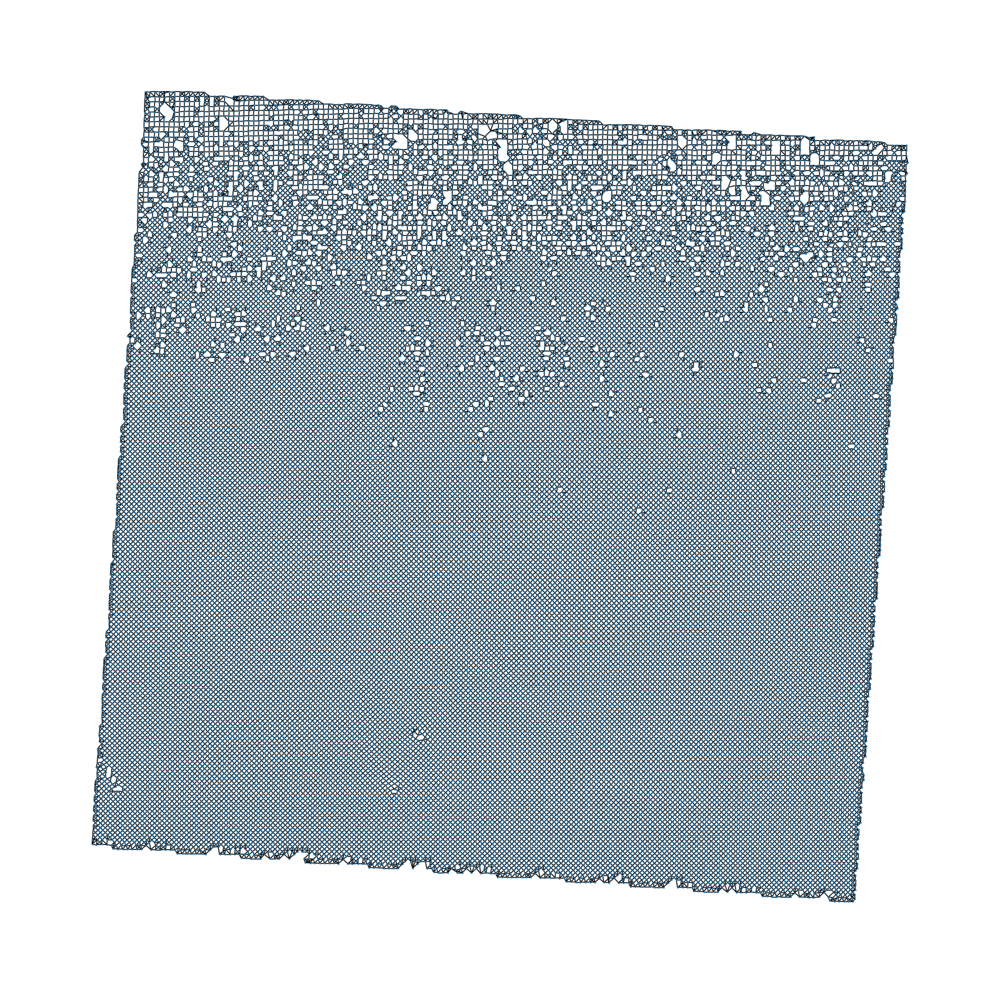

In [15]:
# Construct a graph of the regions where the nodes are the regions and the edges are the nearest neighbors
# The graph should be represented as a networkx graph, where the nodes are the region indices and the edges are the distances
# The graph should be undirected and the nodes should contain the centroid coordinates
from networkx import Graph
import networkx as nx

def construct_graph(dists, indices, centroids):
    G = Graph()
    for i, (dist, idx) in enumerate(zip(dists, indices)):
        for d, j in zip(dist, idx):
            G.add_edge(i, j, weight=d)
        G.nodes[i]['centroid'] = centroids[i]
        G.nodes[i]['size'] = class_data['size'][i]
    return G

G = construct_graph(dists, indices, centroids)
print(G.nodes[0])

# Plot the graph with the nodes colored by the region size
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_size=1, ax=ax)
plt.show()

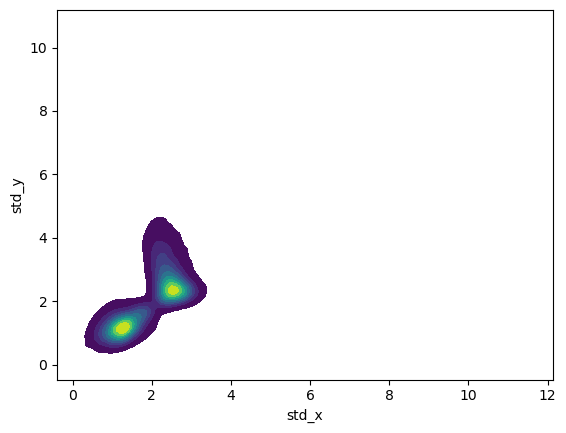

<Figure size 640x480 with 0 Axes>

In [16]:
sns.kdeplot(data=class_data, x='std_x', y='std_y', fill=True, cmap='viridis')

fig = plt.figure()

shape: (44_324, 6)
┌───────┬──────┬──────────┬──────────┬──────────┬──────────┐
│ class ┆ size ┆ median_x ┆ median_y ┆ std_x    ┆ std_y    │
│ ---   ┆ ---  ┆ ---      ┆ ---      ┆ ---      ┆ ---      │
│ u32   ┆ u32  ┆ u32      ┆ u32      ┆ f32      ┆ f32      │
╞═══════╪══════╪══════════╪══════════╪══════════╪══════════╡
│ 1     ┆ 164  ┆ 80       ┆ 378      ┆ 8.083543 ┆ 7.511351 │
│ 2     ┆ 69   ┆ 82       ┆ 403      ┆ 2.517988 ┆ 2.366539 │
│ 3     ┆ 65   ┆ 84       ┆ 428      ┆ 2.554217 ┆ 2.051641 │
│ 4     ┆ 58   ┆ 85       ┆ 453      ┆ 2.469553 ┆ 1.896552 │
│ 5     ┆ 56   ┆ 85       ┆ 477      ┆ 2.325477 ┆ 1.936409 │
│ …     ┆ …    ┆ …        ┆ …        ┆ …        ┆ …        │
│ 44379 ┆ 121  ┆ 4362     ┆ 3976     ┆ 3.783951 ┆ 4.316028 │
│ 44380 ┆ 86   ┆ 4361     ┆ 4004     ┆ 2.474341 ┆ 3.161615 │
│ 44381 ┆ 100  ┆ 4361     ┆ 4030     ┆ 2.448898 ┆ 3.586238 │
│ 44382 ┆ 6    ┆ 4367     ┆ 3886     ┆ 0.745356 ┆ 0.745356 │
│ 44383 ┆ 13   ┆ 4371     ┆ 3941     ┆ 1.098681 ┆ 1.071414 │
└────

/tmp/ipykernel_128653/3658167848.py:8: NumbaTypeSafetyWarning: unsafe cast from int64 to uint32. Precision may be lost.
  class_map[0] = 0


[0 1 2]


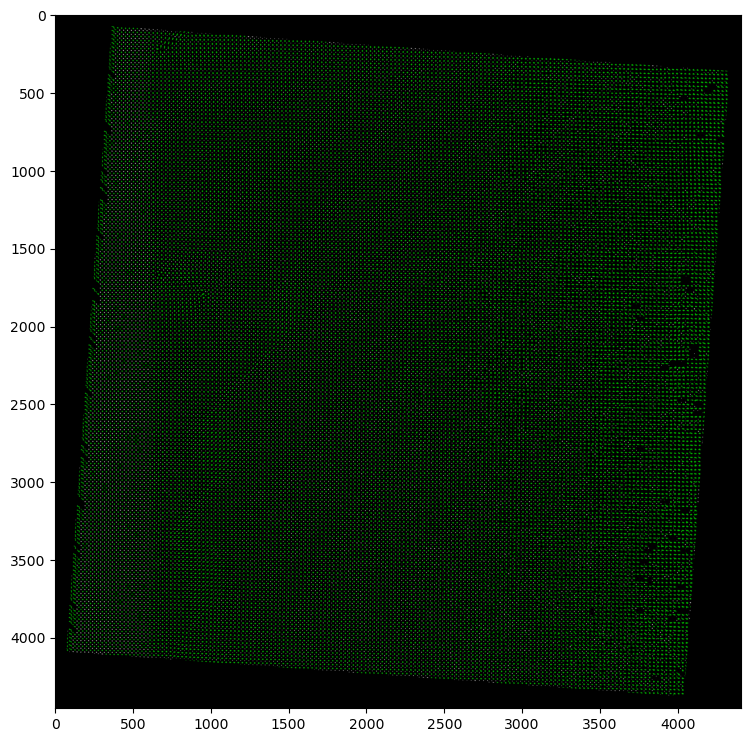

In [17]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

print(class_data)
@numba.njit(fastmath=True, parallel=True)
def reassign_classes(org_img: np.ndarray, org_classes: np.ndarray, y_pred: np.ndarray):
    class_map = dict(zip(org_classes,y_pred))
    class_map[0] = 0
    output = np.zeros_like(org_img)

    n_row, n_col = org_img.shape
    for row_i in numba.prange(n_row):
        for col_i in numba.prange(n_col):
            output[row_i][col_i] = class_map[org_img[row_i][col_i]]
    return output

# Cluster the data
feats = ['std_x', 'std_y', 'size']#, 'median_x', 'median_y']
# y_pred = KMeans(n_clusters=2, random_state=42).fit_predict(class_data[feats]) + 1
y_pred = GaussianMixture(n_components=2, random_state=42).fit_predict(class_data[feats]) + 1
# y_pred = class_data['size'].to_numpy() > 50
# y_pred = y_pred.astype(np.uint32) + 1
org_img = images[0]['pruned'].astype(np.uint32)
org_classes = class_data['class'].to_numpy()

new_labels = reassign_classes(
    org_img, 
    org_classes, 
    y_pred
)
print(np.unique(new_labels))

# Plotting
fig, ax = plt.subplots(1, 1, figsize=(9, 9))
ax.imshow(new_labels, cmap='nipy_spectral')

cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(new_labels))))
colored_new_labels = np.array([cm[label] for label in new_labels])
colored_new_labels = (colored_new_labels * 255).astype(np.uint8)  # Convert to uint8

img = Image.fromarray(colored_new_labels)
img.save(target/f"sample_{0}_gmm.png")

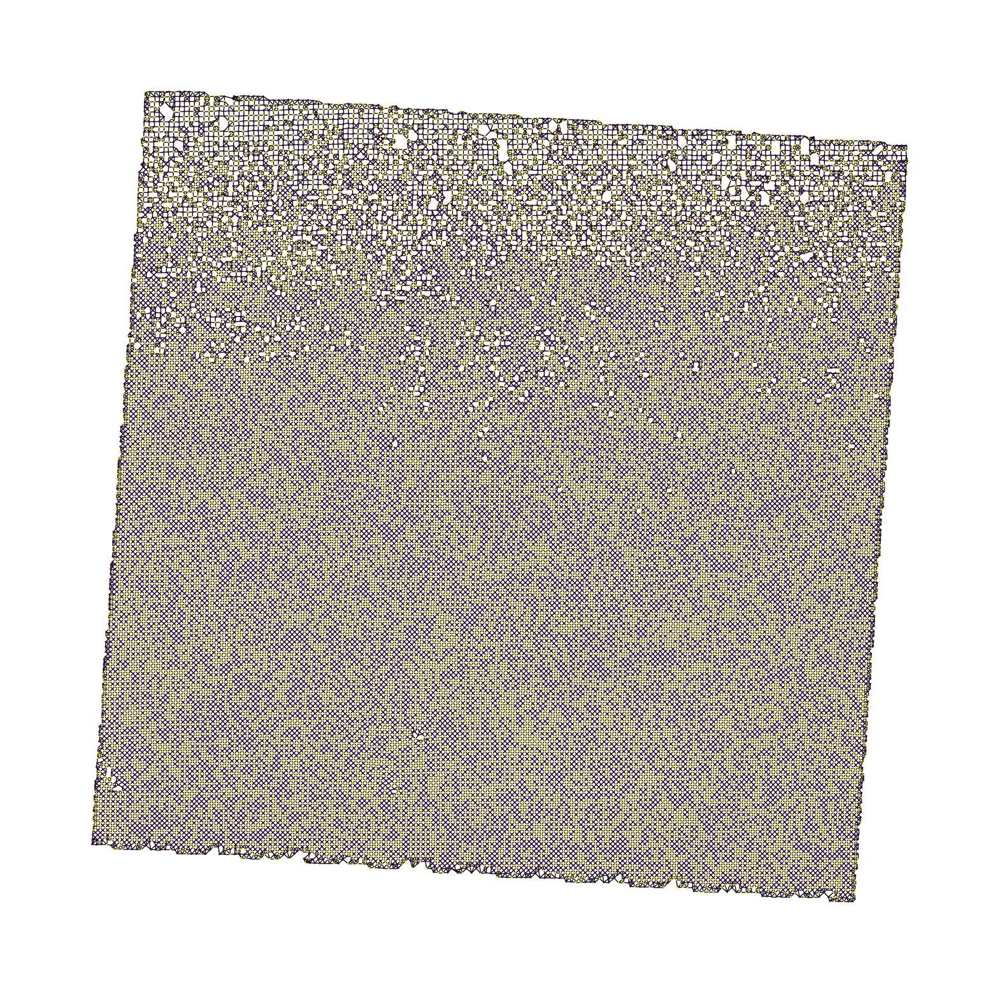

In [18]:
# Plot the graph colored by the new classes
G = construct_graph(dists, indices, centroids)
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_color=y_pred, node_size=1, ax=ax)
plt.show()